In [ ]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import torch
import torchvision
from torch import nn
from torch import optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
from torchvision.datasets import ImageFolder



In [ ]:
# A0220882H
# e0556074
# Mo Yunbin

# This notebook is organized into sections for easier navigation

### Connect to Google drive

In [ ]:
# please comment out this cell if no need to use google drive
from google.colab import drive
drive.mount('/content/drive')
# please modify the path below if needed
%cd drive/MyDrive/CS5242/Project

Mounted at /content/drive
/content/drive/MyDrive/CS5242/Project


### Load data

In [ ]:
transform_train_wbc = transforms.Compose([
    transforms.Resize(size=(224, 224)), # resize to 224 x 224
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=15),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # normalize for each channel
])

transform_val_wbc = transforms.Compose([
    transforms.Resize(size=(224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
# Function to get trainset
def get_trainset_wbc(percentage):
    data_dir = 'datasets/WBC_' + str(percentage) + '/'
    trainset_wbc = ImageFolder(data_dir+'train/data', transform=transform_train_wbc)

    return trainset_wbc

In [ ]:
learning_rate = 0.001
num_epochs = 30
batch_size = 64

In [ ]:
# Load full WBC data
trainset_wbc_100 = get_trainset_wbc(100)
valset_wbc_100 = ImageFolder('datasets/WBC_100/val/data', transform=transform_val_wbc)

wbc_100_trainloader = torch.utils.data.DataLoader(
    trainset_wbc_100,
    batch_size=batch_size,
    shuffle=True
)

wbc_100_valloader = torch.utils.data.DataLoader(
    valset_wbc_100,
    batch_size=batch_size,
    shuffle=True
)

In [ ]:
# Load 50% WBC data
trainset_wbc_50 = get_trainset_wbc(50)

wbc_50_trainloader = torch.utils.data.DataLoader(
    trainset_wbc_50,
    batch_size=batch_size,
    shuffle=True
)

In [ ]:
# Load 10% WBC data
trainset_wbc_10 = get_trainset_wbc(10)

wbc_10_trainloader = torch.utils.data.DataLoader(
    trainset_wbc_10,
    batch_size=batch_size,
    shuffle=True
)

In [ ]:
# Load 1% WBC data
trainset_wbc_1 = get_trainset_wbc(1)

wbc_1_trainloader = torch.utils.data.DataLoader(
    trainset_wbc_1,
    batch_size=batch_size,
    shuffle=True
)

In [ ]:
# mapping between index and cell class
print(trainset_wbc_100.class_to_idx)

{'Basophil': 0, 'Eosinophil': 1, 'Lymphocyte': 2, 'Monocyte': 3, 'Neutrophil': 4}


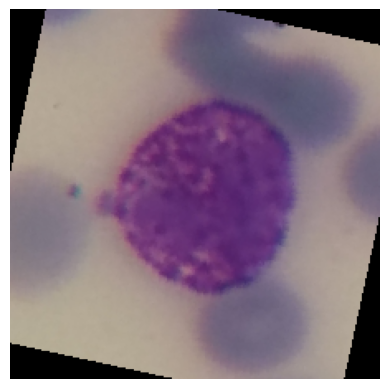

In [ ]:
# for printing the image for visualization
def get_np_img(img, mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)):

    new_img = img.numpy().transpose(1, 2 ,0)
    new_img = new_img * std + mean
    new_img = np.clip(new_img, 0, 1)

    return new_img

plt.imshow(get_np_img(trainset_wbc_100[0][0]))
plt.axis('off')
plt.show()

 ### Train without additionali information

#### Function definitions

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # device object

In [ ]:
def make_finetune_resnet():
  resnet = torch.hub.load('pytorch/vision', 'resnet18', weights=True)
  # Modify output feature to be 5
  num_features = resnet.fc.in_features
  resnet.fc = nn.Linear(num_features, 5) # binary classification (num_of_class == 2)

  # freeze the layers that learn general features
  for name, param in resnet.named_parameters():
      if 'conv1' in name or 'bn1' in name or 'layer1' in name or 'layer2' in name:
          param.requires_grad = False
  resnet.to(device)
  return resnet

In [ ]:
def train(model, dataloader, epoch):
  total_step = len(dataloader) # len(dataloader)/batch_size steps
  running_loss = 0.0
  for i, (inputs, labels) in enumerate(dataloader):
      inputs = inputs.to(device)
      labels = labels.to(device)

      optimizer.zero_grad()

      # forward
      outputs = model(inputs)
      loss = criterion(outputs, labels)

      # backprop
      loss.backward()
      optimizer.step()

      running_loss += loss.item()
      if (i+1) % 20 == 0:
        print ('Epoch [{}/{}], Step [{}/{}], Train loss: {:.4f}'.format(epoch+1, num_epochs, i+1, total_step, loss.item()))
  # Print loss at each epoch
  print(f"Epoch {epoch+1} Loss: {running_loss/len(dataloader)}")
  # return loss for this epoch
  return running_loss/len(dataloader)

In [ ]:
def validate(model, dataloader, epoch):
  model.eval()
  model.to(device)
  correct = 0
  total = 0
  val_acc = 0
  val_loss = 0

  with torch.no_grad():
      for batch_idx, (images, labels) in enumerate(dataloader):
        images, labels = images.to(device), labels.to(device)
        pred = model(images)
        loss = criterion(pred, labels)
        val_loss += loss.item()*images.size(0)

        _, predicted = pred.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

  val_acc = correct / total
  # test_losses.append(test_loss/total)
  # test_accs.append(val_acc)
  print('--- Epoch {} Validation Accurancy: {:.3f}, Validation Loss: {:.4f} --- '.format(epoch+1, val_acc, val_loss/total))
  return val_acc, val_loss/total

#### Train with 100% WBC data

In [ ]:
# Train with full data
resnet_wbc_100 = make_finetune_resnet()
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resnet_wbc_100.parameters(), lr=learning_rate, momentum=0.9)

train_loss_100 = []
validate_loss_100 = []
validate_acc_100 = []
val_acc_max = float('-inf')
for epoch in range(num_epochs):
    train_loss = train(resnet_wbc_100, wbc_100_trainloader, epoch)
    val_acc, val_loss = validate(resnet_wbc_100, wbc_100_valloader, epoch)
    if val_acc > val_acc_max:
      # saving best model
      torch.save(resnet_wbc_100.state_dict(), 'resnet_wbc_100.pt')
      val_acc_max = val_acc
    # for visualization later
    train_loss_100.append(train_loss)
    validate_loss_100.append(val_loss)
    validate_acc_100.append(val_acc)


Using cache found in /root/.cache/torch/hub/pytorch_vision_main
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/30], Step [20/132], Train loss: 1.0491
Epoch [1/30], Step [40/132], Train loss: 0.8166
Epoch [1/30], Step [60/132], Train loss: 0.5115
Epoch [1/30], Step [80/132], Train loss: 0.3275
Epoch [1/30], Step [100/132], Train loss: 0.3881
Epoch [1/30], Step [120/132], Train loss: 0.4275
Epoch 1 Loss: 0.6209956327396812
--- Epoch 1 Validation Accurancy: 0.883, Validation Loss: 0.3702 --- 
Epoch [2/30], Step [20/132], Train loss: 0.1256
Epoch [2/30], Step [40/132], Train loss: 0.1270
Epoch [2/30], Step [60/132], Train loss: 0.1661
Epoch [2/30], Step [80/132], Train loss: 0.0410
Epoch [2/30], Step [100/132], Train loss: 0.2131
Epoch [2/30], Step [120/132], Train loss: 0.1859
Epoch 2 Loss: 0.177941262552684
--- Epoch 2 Validation Accurancy: 0.948, Validation Loss: 0.1584 --- 
Epoch [3/30], Step [20/132], Train loss: 0.0683
Epoch [3/30], Step [40/132], Train loss: 0.0875
Epoch [3/30], Step [60/132], Train loss: 0.0666
Epoch [3/30], Step [80/132], Train loss: 0.1196
Epoch [3/30], Step [100

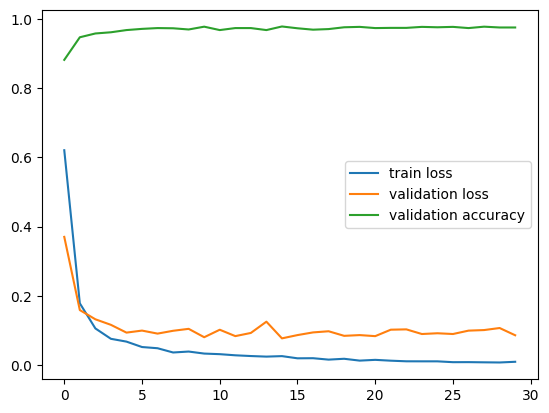

In [ ]:
plt.plot(np.arange(num_epochs), train_loss_100, label='train loss')
plt.plot(np.arange(num_epochs), validate_loss_100, label='validation loss')
plt.plot(np.arange(num_epochs), validate_acc_100, label='validation accuracy')
plt.legend()
plt.show()

#### Train with 50% WBC data

In [ ]:
# Train with 50% data
resnet_wbc_50 = make_finetune_resnet()
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resnet_wbc_50.parameters(), lr=learning_rate, momentum=0.9)

train_loss_50 = []
validate_loss_50 = []
validate_acc_50 = []
val_acc_max = float('-inf')
for epoch in range(num_epochs):
    train_loss = train(resnet_wbc_50, wbc_50_trainloader, epoch)
    val_acc, val_loss = validate(resnet_wbc_50, wbc_100_valloader, epoch)
    if val_acc > val_acc_max:
      # saving best model
      torch.save(resnet_wbc_50.state_dict(), 'resnet_wbc_50.pt')
      val_acc_max = val_acc
    # for visualization later
    train_loss_50.append(train_loss)
    validate_loss_50.append(val_loss)
    validate_acc_50.append(val_acc)

Downloading: "https://github.com/pytorch/vision/zipball/main" to /root/.cache/torch/hub/main.zip
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 131MB/s]


Epoch [1/30], Step [20/66], Train loss: 0.9617
Epoch [1/30], Step [40/66], Train loss: 0.9339
Epoch [1/30], Step [60/66], Train loss: 0.3804
Epoch 1 Loss: 0.8743965571576898
--- Epoch 1 Validation Accurancy: 0.785, Validation Loss: 0.6345 --- 
Epoch [2/30], Step [20/66], Train loss: 0.3275
Epoch [2/30], Step [40/66], Train loss: 0.4421
Epoch [2/30], Step [60/66], Train loss: 0.2948
Epoch 2 Loss: 0.32126270392627426
--- Epoch 2 Validation Accurancy: 0.932, Validation Loss: 0.2200 --- 
Epoch [3/30], Step [20/66], Train loss: 0.2082
Epoch [3/30], Step [40/66], Train loss: 0.1968
Epoch [3/30], Step [60/66], Train loss: 0.0944
Epoch 3 Loss: 0.17218334193934093
--- Epoch 3 Validation Accurancy: 0.933, Validation Loss: 0.1868 --- 
Epoch [4/30], Step [20/66], Train loss: 0.2303
Epoch [4/30], Step [40/66], Train loss: 0.0568
Epoch [4/30], Step [60/66], Train loss: 0.1298
Epoch 4 Loss: 0.11820400983208057
--- Epoch 4 Validation Accurancy: 0.950, Validation Loss: 0.1523 --- 
Epoch [5/30], Step [2

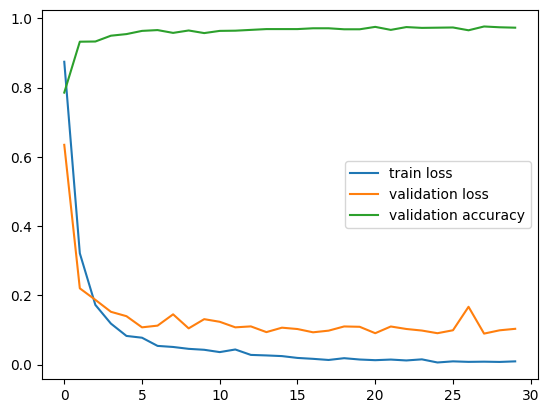

In [ ]:
plt.plot(np.arange(num_epochs), train_loss_50, label='train loss')
plt.plot(np.arange(num_epochs), validate_loss_50, label='validation loss')
plt.plot(np.arange(num_epochs), validate_acc_50, label='validation accuracy')
plt.legend()
plt.show()

#### Train with 10% WBC data

In [ ]:
# Train with 10% data
resnet_wbc_10 = make_finetune_resnet()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resnet_wbc_10.parameters(), lr=learning_rate, momentum=0.9)

train_loss_10 = []
validate_loss_10 = []
validate_acc_10 = []
val_acc_max = float('-inf')
for epoch in range(num_epochs):
    train_loss = train(resnet_wbc_10, wbc_10_trainloader, epoch)
    val_acc, val_loss = validate(resnet_wbc_10, wbc_100_valloader, epoch)
    if val_acc > val_acc_max:
      # saving best model
      torch.save(resnet_wbc_10.state_dict(), 'resnet_wbc_10.pt')
      val_acc_max = val_acc
    # for visualization later
    train_loss_10.append(train_loss)
    validate_loss_10.append(val_loss)
    validate_acc_10.append(val_acc)

Downloading: "https://github.com/pytorch/vision/zipball/main" to /root/.cache/torch/hub/main.zip
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 111MB/s]


Epoch 1 Loss: 1.3085311353206635
--- Epoch 1 Validation Accurancy: 0.456, Validation Loss: 1.2456 --- 
Epoch 2 Loss: 0.9456573597022465
--- Epoch 2 Validation Accurancy: 0.715, Validation Loss: 0.8892 --- 
Epoch 3 Loss: 0.638256100671632
--- Epoch 3 Validation Accurancy: 0.769, Validation Loss: 0.6577 --- 
Epoch 4 Loss: 0.4481630878789084
--- Epoch 4 Validation Accurancy: 0.818, Validation Loss: 0.4846 --- 
Epoch 5 Loss: 0.33307943280254093
--- Epoch 5 Validation Accurancy: 0.873, Validation Loss: 0.3363 --- 
Epoch 6 Loss: 0.3073398768901825
--- Epoch 6 Validation Accurancy: 0.890, Validation Loss: 0.3281 --- 
Epoch 7 Loss: 0.21511647424527577
--- Epoch 7 Validation Accurancy: 0.892, Validation Loss: 0.2825 --- 
Epoch 8 Loss: 0.17659955378621817
--- Epoch 8 Validation Accurancy: 0.932, Validation Loss: 0.2171 --- 
Epoch 9 Loss: 0.13208241441420146
--- Epoch 9 Validation Accurancy: 0.907, Validation Loss: 0.2418 --- 
Epoch 10 Loss: 0.12276994117668696
--- Epoch 10 Validation Accurancy: 

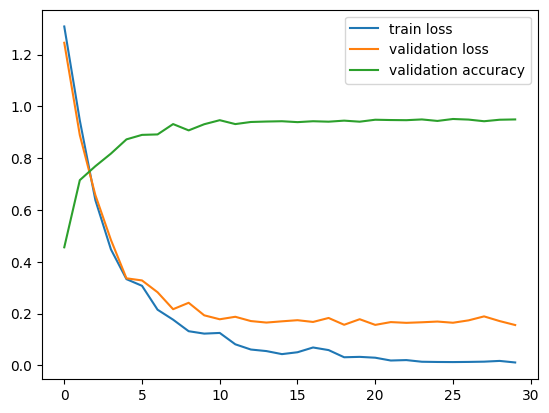

In [ ]:
plt.plot(np.arange(num_epochs), train_loss_10, label='train loss')
plt.plot(np.arange(num_epochs), validate_loss_10, label='validation loss')
plt.plot(np.arange(num_epochs), validate_acc_10, label='validation accuracy')
plt.legend()
plt.show()

#### Train with 1% data

In [ ]:
# Train with 1% data
resnet_wbc_1 = make_finetune_resnet()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resnet_wbc_1.parameters(), lr=learning_rate, momentum=0.9)


train_loss_1 = []
validate_loss_1 = []
validate_acc_1 = []
val_acc_max = float('-inf')
for epoch in range(num_epochs):
    train_loss = train(resnet_wbc_1, wbc_1_trainloader, epoch)
    val_acc, val_loss = validate(resnet_wbc_1, wbc_100_valloader, epoch)
    if val_acc > val_acc_max:
      # saving best model
      torch.save(resnet_wbc_1.state_dict(), 'resnet_wbc_1.pt')
      val_acc_max = val_acc
    # for visualization later
    train_loss_1.append(train_loss)
    validate_loss_1.append(val_loss)
    validate_acc_1.append(val_acc)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


Epoch 1 Loss: 1.71222585439682
--- Epoch 1 Validation Accurancy: 0.192, Validation Loss: 1.7039 --- 
Epoch 2 Loss: 1.2965906262397766
--- Epoch 2 Validation Accurancy: 0.612, Validation Loss: 1.2715 --- 
Epoch 3 Loss: 1.2174379229545593
--- Epoch 3 Validation Accurancy: 0.613, Validation Loss: 1.1082 --- 
Epoch 4 Loss: 1.1511932015419006
--- Epoch 4 Validation Accurancy: 0.613, Validation Loss: 1.0792 --- 
Epoch 5 Loss: 1.111493855714798
--- Epoch 5 Validation Accurancy: 0.532, Validation Loss: 1.1433 --- 
Epoch 6 Loss: 0.9765422344207764
--- Epoch 6 Validation Accurancy: 0.497, Validation Loss: 1.1577 --- 
Epoch 7 Loss: 1.0361990928649902
--- Epoch 7 Validation Accurancy: 0.614, Validation Loss: 1.0760 --- 
Epoch 8 Loss: 0.9635542333126068
--- Epoch 8 Validation Accurancy: 0.613, Validation Loss: 1.0909 --- 
Epoch 9 Loss: 0.8592037558555603
--- Epoch 9 Validation Accurancy: 0.613, Validation Loss: 1.1212 --- 
Epoch 10 Loss: 0.9883875846862793
--- Epoch 10 Validation Accurancy: 0.613, 

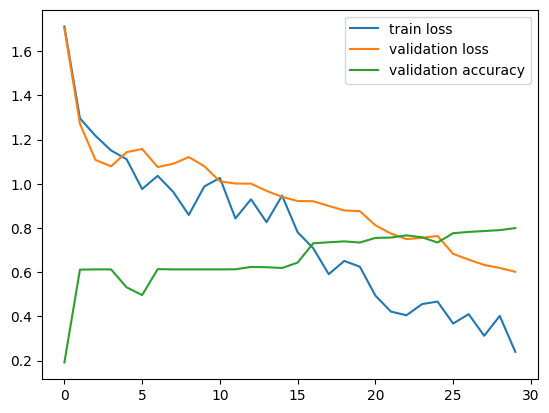

In [ ]:
plt.plot(np.arange(num_epochs), train_loss_1, label='train loss')
plt.plot(np.arange(num_epochs), validate_loss_1, label='validation loss')
plt.plot(np.arange(num_epochs), validate_acc_1, label='validation accuracy')
plt.legend()
plt.show()

### Adding additional information

#### Load masked WBC data

In [ ]:
import cv2
import torchvision.transforms as transforms
from torchvision.transforms import ToPILImage
from google.colab.patches import cv2_imshow

In [ ]:
# Customize the image folder class so that it can return path for us to apply mask
class ImageFolderWithMask(torchvision.datasets.ImageFolder):
    def __getitem__(self, index):
        # ImageFolder normally returns
        original_tuple = super(ImageFolderWithMask, self).__getitem__(index)
        # image path
        path = self.imgs[index][0]
        # apply mask
        mask_path = path.replace('/data', '/mask')
        if os.path.exists(mask_path): # check if a mask exists
            # Load the original image and mask
            image = cv2.imread(path)
            mask = cv2.imread(mask_path, 0)  # Load the mask as a grayscale image
            # Ensure the mask is binary (0 and 255 values)
            _, mask = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)
            # Mask the original image
            masked_image = cv2.bitwise_and(image, image, mask=mask)
            # return a new tuple containing the masked image
            masked_image = transforms.ToPILImage()(transforms.ToTensor()(masked_image))
            original_tuple = (masked_image, original_tuple[1])
            # Display the masked image (optional)
            # cv2_imshow(masked_image) # in colab cv2.imshow lead to crash, use cv2_imshow imported above
            # cv2.waitKey(0)
            # cv2.destroyAllWindows()
        return original_tuple

In [ ]:
class transformFurther(Dataset):
    def __init__(self, dataset, transform=None):
        self.dataset = dataset
        self.transform = transform

    def __getitem__(self, index):
        x, y = self.dataset[index]
        if self.transform:
            x = self.transform(x)
        return x, y

    def __len__(self):
        return len(self.dataset)

In [ ]:
# Function to get trainset
def get_trainset_wbc_masked(percentage):
    data_dir = 'datasets/WBC_' + str(percentage) + '/'
    # First load data and apply mask if applicable
    trainset_wbc_masked = ImageFolderWithMask(data_dir+'train/data')
    # Further do normal augmentation
    trainset_wbc_masked = transformFurther(trainset_wbc_masked, transform=transform_train_wbc)

    return trainset_wbc_masked

In [ ]:
learning_rate = 0.001
num_epochs = 30
batch_size = 64

In [ ]:
# Load masked data
trainset_wbc_100_masked = get_trainset_wbc_masked(100)

wbc_100_maksed_trainloader = torch.utils.data.DataLoader(
    trainset_wbc_100_masked,
    batch_size=batch_size,
    shuffle=True
)

trainset_wbc_50_masked = get_trainset_wbc_masked(50)

wbc_50_maksed_trainloader = torch.utils.data.DataLoader(
    trainset_wbc_50_masked,
    batch_size=batch_size,
    shuffle=True
)

trainset_wbc_10_masked = get_trainset_wbc_masked(10)

wbc_10_maksed_trainloader = torch.utils.data.DataLoader(
    trainset_wbc_10_masked,
    batch_size=batch_size,
    shuffle=True
)

trainset_wbc_1_masked = get_trainset_wbc_masked(1)

wbc_1_maksed_trainloader = torch.utils.data.DataLoader(
    trainset_wbc_1_masked,
    batch_size=batch_size,
    shuffle=True
)


#### Using CAM16

In [ ]:
import cv2
import os
from google.colab.patches import cv2_imshow

In [ ]:
data_dir_cam16 = 'datasets/CAM16_100cls_10mask/'

In [ ]:
def mask_tumor_image():
  for filename in os.listdir(data_dir_cam16 + 'train/data/tumor'):
    if os.path.exists(data_dir_cam16 + 'train/mask/tumor/' + filename):
      # Load the original image and mask
      image = cv2.imread(data_dir_cam16 + 'train/data/tumor/' + filename)
      mask = cv2.imread(data_dir_cam16 + 'train/mask/tumor/' + filename, 0)  # Load the mask as a grayscale image
      # Ensure the mask is binary (0 and 255 values)
      _, mask = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)
      # Mask the original image
      masked_image = cv2.bitwise_and(image, image, mask=mask)
      # Save the masked image
      cv2.imwrite(data_dir_cam16 + 'train/data/tumor/' + 'masked_' + filename, masked_image)
      # Display the masked image (optional)
      cv2_imshow(masked_image) # in colab cv2.imshow lead to crash, use cv2_imshow imported above
      cv2.waitKey(0)
      cv2.destroyAllWindows()

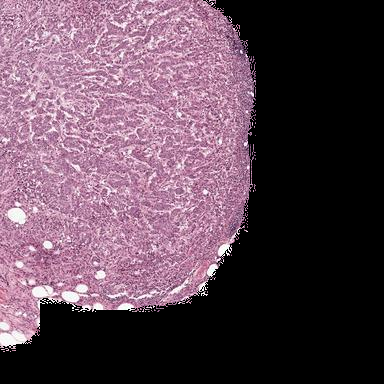

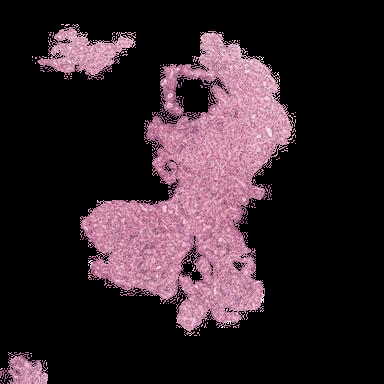

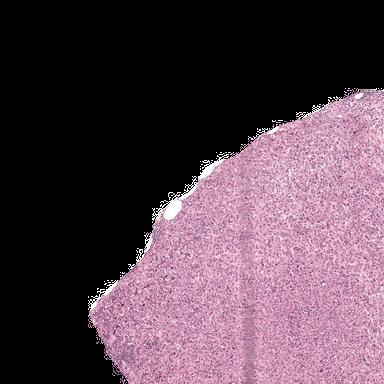

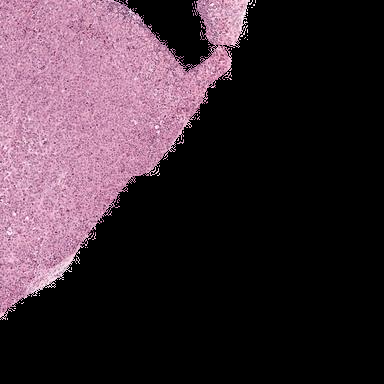

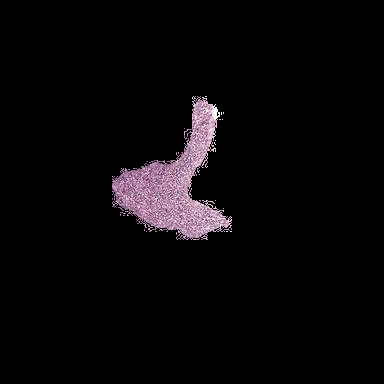

...

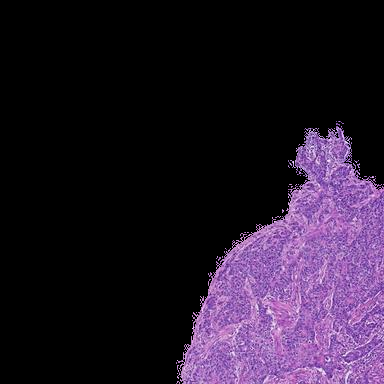

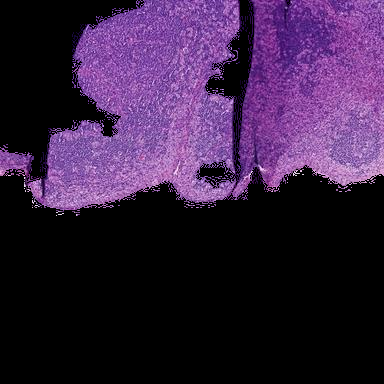

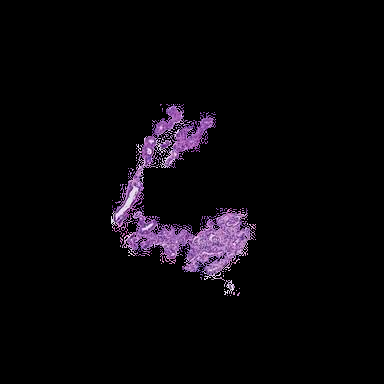

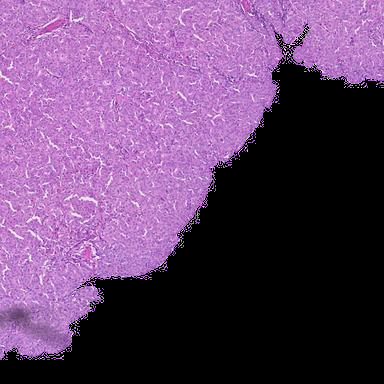

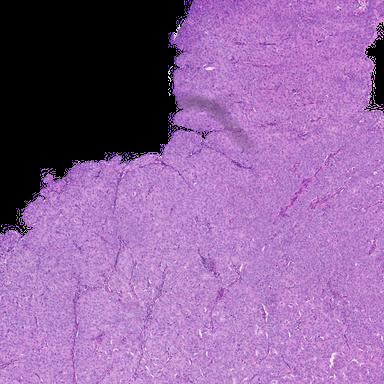

In [ ]:
# make masked images for tumor images as part of the trianing data and store them in the same folder as tumor images
mask_tumor_image()

In [ ]:
learning_rate = 0.001
num_epochs = 20
batch_size = 32

In [ ]:
transform_train_cam16 = transforms.Compose([
    transforms.Resize(size=(224, 224)), # resize to 224 x 224
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=15),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # normalize for each channel
])

transform_val_cam16 = transforms.Compose([
    transforms.Resize(size=(224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
# Load cam16 data
trainset_cam16 = ImageFolder(data_dir_cam16+'train/data', transform=transform_train_cam16)
testset_cam16 = ImageFolder(data_dir_cam16+'test/data', transform=transform_val_cam16)
valset_cam16 = ImageFolder(data_dir_cam16+'val/data', transform=transform_val_cam16)

cam16_trainloader = torch.utils.data.DataLoader(
    trainset_cam16,
    batch_size=batch_size,
    shuffle=True
)

cam16_testloader = torch.utils.data.DataLoader(
    testset_cam16,
    batch_size=batch_size,
    shuffle=True
)

cam16_valloader = torch.utils.data.DataLoader(
    valset_cam16,
    batch_size=batch_size,
    shuffle=True
)

In [ ]:
# mapping between index and cell class
print(trainset_cam16.class_to_idx)

{'normal': 0, 'tumor': 1}


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # device object

In [ ]:
def make_binary_resnet():
  resnet = torch.hub.load('pytorch/vision', 'resnet18', weights=True)
  # Modify output feature to be 2
  num_features = resnet.fc.in_features
  resnet.fc = nn.Linear(num_features, 2) # binary classification (num_of_class == 2)

  # freeze the layers that learn general features
  for name, param in resnet.named_parameters():
      # if 'conv1' in name or 'bn1' in name or 'layer1' in name or 'layer2' in name:
      if 'conv1' in name or 'bn1' in name or 'layer1' in name: # try update more layers
          param.requires_grad = False
  resnet.to(device)
  return resnet

In [ ]:
# Train a binary classifier
resnet_cam16 = make_binary_resnet()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resnet_cam16.parameters(), lr=learning_rate, momentum=0.9)


train_loss_cam16 = []
validate_loss_cam16 = []
validate_acc_cam16 = []
best_acc = float('-inf')
for epoch in range(num_epochs):
    train_loss = train(resnet_cam16, cam16_trainloader, epoch)
    val_acc, val_loss = validate(resnet_cam16, cam16_valloader, epoch)

    if val_acc > best_acc:
      torch.save(resnet_cam16.state_dict(), 'resnet_cam16.pt')
      best_acc = val_acc
    train_loss_cam16.append(train_loss)
    validate_loss_cam16.append(val_loss)
    validate_acc_cam16.append(val_acc)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


Epoch [1/20], Step [20/25], Train loss: 0.5565
Epoch 1 Loss: 0.6071039843559265
--- Epoch 1 Validation Accurancy: 0.787, Validation Loss: 0.4639 --- 
Epoch [2/20], Step [20/25], Train loss: 0.2254
Epoch 2 Loss: 0.3513693344593048
--- Epoch 2 Validation Accurancy: 0.833, Validation Loss: 0.3733 --- 
Epoch [3/20], Step [20/25], Train loss: 0.1593
Epoch 3 Loss: 0.241898752450943
--- Epoch 3 Validation Accurancy: 0.861, Validation Loss: 0.3447 --- 
Epoch [4/20], Step [20/25], Train loss: 0.2887
Epoch 4 Loss: 0.19279759734869004
--- Epoch 4 Validation Accurancy: 0.852, Validation Loss: 0.3974 --- 
Epoch [5/20], Step [20/25], Train loss: 0.2579
Epoch 5 Loss: 0.28864119231700897
--- Epoch 5 Validation Accurancy: 0.880, Validation Loss: 0.3214 --- 
Epoch [6/20], Step [20/25], Train loss: 0.1684
Epoch 6 Loss: 0.1811768838763237
--- Epoch 6 Validation Accurancy: 0.898, Validation Loss: 0.3233 --- 
Epoch [7/20], Step [20/25], Train loss: 0.0495
Epoch 7 Loss: 0.13696695104241371
--- Epoch 7 Valida

In [ ]:
# Test on test dataset
test_acc, test_loss = validate(resnet_cam16, cam16_testloader, 0)
print(test_acc, test_loss)

--- Epoch 1 Validation Accurancy: 0.921, Validation Loss: 0.3190 --- 
0.9212962962962963 0.318990762035052


#### Using pRCC

##### Train autoencoder using pRCC

In [ ]:
from torch.utils import data
from torch.autograd import Variable
from PIL import Image

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # device object

In [ ]:
learning_rate = 0.001
num_epochs = 40
batch_size = 32

In [ ]:
def train_prcc(model, dataloader, epoch):
  total_step = len(dataloader) # len(dataloader)/batch_size steps
  running_loss = 0.0
  for i, inputs in enumerate(dataloader):
      inputs = inputs.to(device)

      optimizer.zero_grad()

      # forward
      outputs = model(inputs)
      loss = criterion(outputs, inputs)

      # backprop
      loss.backward()
      optimizer.step()

      running_loss += loss.item()
      if (i+1) % 20 == 0:
        print ('Epoch [{}/{}], Step [{}/{}], Train loss: {:.4f}'.format(epoch+1, num_epochs, i+1, total_step, loss.item()))
  # Print loss at each epoch
  print(f"Epoch {epoch+1} Loss: {running_loss/len(dataloader)}")
  # return loss for this epoch
  return running_loss/len(dataloader)

In [ ]:
# define own class to load pRCC as it has no label
class ImageNoLabel(data.Dataset):
    def __init__(self,root, transform=None):
        imgs=os.listdir(root)
        self.imgs=[os.path.join(root,k) for k in imgs]
        self.transforms=transform

    def __getitem__(self, index):
        img_path = self.imgs[index]
        pil_img = Image.open(img_path)
        if self.transforms:
          data = self.transforms(pil_img)
        else:
          pil_img = np.asarray(pil_img)
          data = torch.from_numpy(pil_img)
        return torch.as_tensor(data)

    def __len__(self):
        return len(self.imgs)

In [ ]:
# Loading pRCC dataset
data_dir_prcc = 'datasets/pRCC_nolabel/'
transform_prcc = transforms.Compose([
    transforms.Resize(size=(224, 224)), # resize to 224 x 224
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # normalize for each channel
])

# Load pRCC data
dataset_prcc = ImageNoLabel(data_dir_prcc, transform=transform_prcc)

prcc_loader = torch.utils.data.DataLoader(
    dataset_prcc,
    batch_size=batch_size,
    shuffle=True
)

In [ ]:
# Train an autoencoder to reconstruct the pRCC picture
class PRCCAutoEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(16, 8, kernel_size=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(8*56*56, 512),
            nn.ReLU(),
        )
        self.decoder = nn.Sequential(
            nn.Linear(512, 8*56*56),
            nn.ReLU(),
            nn.Unflatten(dim=1, unflattened_size=(8, 56, 56)),
            nn.ConvTranspose2d(8, 8, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(8, 16, kernel_size=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 3, kernel_size=1),
            nn.ReLU()
        )

    def forward(self, x):
        encoded_x = self.encoder(x)
        decoded_x = self.decoder(encoded_x)
        return decoded_x

In [ ]:
pRCC_autoencoder = PRCCAutoEncoder().to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(pRCC_autoencoder.parameters(), lr=learning_rate)


train_loss_prcc = []
min_loss = float('inf')
for epoch in range(num_epochs):
    train_loss = train_prcc(pRCC_autoencoder, prcc_loader, epoch)
    if train_loss < min_loss:
      torch.save(pRCC_autoencoder.state_dict(), 'pRCC_autoencoder.pt')
      min_loss = train_loss
    # for visualization later
    train_loss_prcc.append(train_loss)

Epoch [1/40], Step [20/45], Train loss: 0.9876
Epoch [1/40], Step [40/45], Train loss: 0.7005
Epoch 1 Loss: 0.9251455320252313
Epoch [2/40], Step [20/45], Train loss: 0.6597
Epoch [2/40], Step [40/45], Train loss: 0.7738
Epoch 2 Loss: 0.7506229427125719
Epoch [3/40], Step [20/45], Train loss: 0.7083
Epoch [3/40], Step [40/45], Train loss: 0.8163
Epoch 3 Loss: 0.7348364763789706
Epoch [4/40], Step [20/45], Train loss: 0.8433
Epoch [4/40], Step [40/45], Train loss: 0.7402
Epoch 4 Loss: 0.7335209793514675
Epoch [5/40], Step [20/45], Train loss: 0.7098
Epoch [5/40], Step [40/45], Train loss: 0.8111
Epoch 5 Loss: 0.7322974695099724
Epoch [6/40], Step [20/45], Train loss: 0.6723
Epoch [6/40], Step [40/45], Train loss: 0.8326
Epoch 6 Loss: 0.7277000188827515
Epoch [7/40], Step [20/45], Train loss: 0.7162
Epoch [7/40], Step [40/45], Train loss: 0.7774
Epoch 7 Loss: 0.7278098066647848
Epoch [8/40], Step [20/45], Train loss: 0.7853
Epoch [8/40], Step [40/45], Train loss: 0.7197
Epoch 8 Loss: 0.7

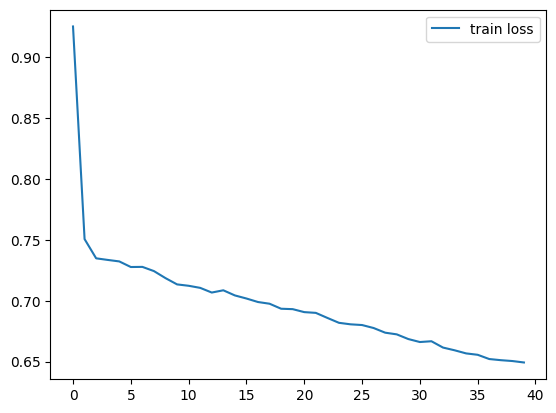

In [ ]:
plt.plot(np.arange(num_epochs), train_loss_prcc, label='train loss')
plt.legend()
plt.show()

##### Train binary classifier using pRCC

In [ ]:
from torchvision.models import vgg16
from sklearn.decomposition import PCA
from keras.preprocessing.image import load_img
# clustering and dimension reduction
from sklearn.cluster import KMeans

In [ ]:
vgg16_loaded = vgg16(weights='IMAGENET1K_V1')

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:06<00:00, 79.4MB/s]


In [ ]:
def extract_features(model, dataloader):
  model.eval()
  features = []
  with torch.no_grad():
    for i, images in enumerate(dataloader):
      x = model.features(images)
      x = model.avgpool(x)
      x = torch.flatten(x)
      x = x.view(-1, 512*7*7)
      out = model.classifier[:-2](x) # remove the classification layer and get the feature only
      features.append(out)
  return features

In [ ]:
prcc_loader_feat = torch.utils.data.DataLoader(
    dataset_prcc,
    batch_size=batch_size,
    shuffle=False # disable shuffle to match label with image easier
)
features = extract_features(vgg16_loaded, prcc_loader_feat)

In [ ]:
features_saved = []
for x in features:
  features_saved += x
features_saved = np.array([x.detach().cpu().numpy() for x in features_saved])
features_saved.shape

(1419, 4096)

In [ ]:
np.savetxt("prcc_feature.csv", features_saved, delimiter=",")

In [ ]:
# Do PCA to reduce dimension for K-means
pca = PCA(n_components=100, random_state=26)
pca.fit(features_saved)

PCA(n_components=100, random_state=26)

In [ ]:
features_reduced = pca.transform(features_saved)
features_reduced.shape

(1419, 100)

In [ ]:
kmeans = KMeans(n_clusters=2, random_state=26)
kmeans.fit(features_reduced)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=2, random_state=26)

In [ ]:
kmeans.labels_

array([0, 0, 0, ..., 0, 1, 0], dtype=int32)

In [ ]:
np.savetxt("prcc_cluster_label.csv", kmeans.labels_, delimiter=",")

In [ ]:
prcc_labels = np.loadtxt("prcc_cluster_label.csv")

In [ ]:
groups = {}
for file, cluster in zip(os.listdir(data_dir_prcc), prcc_labels):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

In [ ]:
# function to visualize clustered image
def visualize_cluster(cluster):
    plt.figure(figsize = (25,25));
    # gets the list of filenames for a cluster
    files = groups[cluster]
    # only allow up to 30 images to be shown at a time
    if len(files) > 30:
        print(f"Taking 30 images out of {len(files)}")
        files = files[:29]
    # plot each image in the cluster
    for index, file in enumerate(files):
        plt.subplot(10,10,index+1);
        img = load_img(data_dir_prcc + file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')

Taking 30 images out of 610


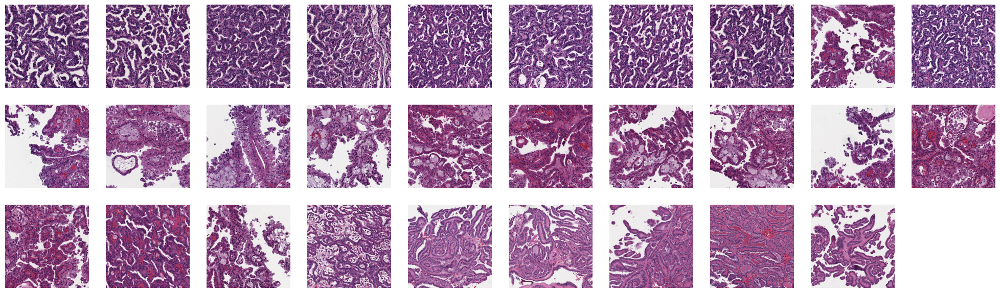

In [ ]:
visualize_cluster(0)

Taking 30 images out of 809


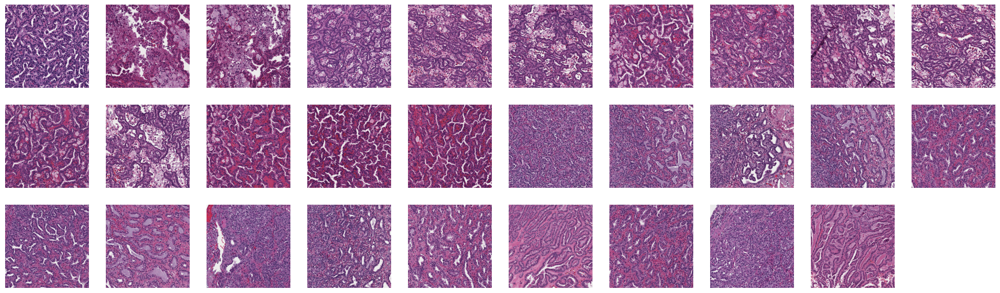

In [ ]:
visualize_cluster(1)

In [ ]:
# Assign label to clustered images
class ClusteredPRCC(data.Dataset):
    def __init__(self,root, transform=None, labels=None):
        imgs=os.listdir(root)
        self.imgs=[os.path.join(root,k) for k in imgs]
        self.transforms=transform
        self.labels = labels

    def __getitem__(self, index):
        img_path = self.imgs[index]
        pil_img = Image.open(img_path)
        if self.transforms:
          data = self.transforms(pil_img)
        else:
          pil_img = np.asarray(pil_img)
          data = torch.from_numpy(pil_img)
        return torch.as_tensor(data), int(self.labels[index])

    def __len__(self):
        return len(self.imgs)

In [ ]:
learning_rate = 0.001
num_epochs = 20
batch_size = 32

In [ ]:
# initialize dataset
clustered_prcc = ClusteredPRCC(data_dir_prcc, transform=transform_prcc, labels=prcc_labels)

# split into train and test set
generator = torch.Generator().manual_seed(26)
prcc_cluster_train, prcc_cluster_test = torch.utils.data.random_split(clustered_prcc, [0.8, 0.2], generator=generator)

# initialize dataloader
prcc_cluster_train_loader = torch.utils.data.DataLoader(
    prcc_cluster_train,
    batch_size=batch_size,
    shuffle=True
)

prcc_cluster_test_loader = torch.utils.data.DataLoader(
    prcc_cluster_test,
    batch_size=batch_size,
    shuffle=True
)

In [ ]:
# Train a binary classifier to distinguish two types of clustered images
pRCC_clustered_resnet = make_binary_resnet()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(pRCC_clustered_resnet.parameters(), lr=learning_rate, momentum=0.9)


train_loss_prcc_clustered = []
validate_loss_prcc_clustered = []
validate_acc_prcc_clustered = []
best_acc = float('-inf')
for epoch in range(num_epochs):
    train_loss = train(pRCC_clustered_resnet, prcc_cluster_train_loader, epoch)
    val_acc, val_loss = validate(pRCC_clustered_resnet, prcc_cluster_test_loader, epoch)
    if val_acc > best_acc:
      torch.save(pRCC_clustered_resnet.state_dict(), 'pRCC_clustered_resnet.pt')
      best_acc = val_acc
    # for visualization later
    train_loss_prcc_clustered.append(train_loss)
    validate_loss_prcc_clustered.append(val_loss)
    validate_acc_prcc_clustered.append(val_acc)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


Epoch [1/20], Step [20/36], Train loss: 0.4579
Epoch 1 Loss: 0.5676875313123068
--- Epoch 1 Validation Accurancy: 0.837, Validation Loss: 0.3685 --- 
Epoch [2/20], Step [20/36], Train loss: 0.3436
Epoch 2 Loss: 0.2623464059498575
--- Epoch 2 Validation Accurancy: 0.834, Validation Loss: 0.3808 --- 
Epoch [3/20], Step [20/36], Train loss: 0.1901
Epoch 3 Loss: 0.20904945809808043
--- Epoch 3 Validation Accurancy: 0.827, Validation Loss: 0.4356 --- 
Epoch [4/20], Step [20/36], Train loss: 0.1429
Epoch 4 Loss: 0.14113716036081314
--- Epoch 4 Validation Accurancy: 0.901, Validation Loss: 0.2556 --- 
Epoch [5/20], Step [20/36], Train loss: 0.0238
Epoch 5 Loss: 0.05918280249978933
--- Epoch 5 Validation Accurancy: 0.912, Validation Loss: 0.2532 --- 
Epoch [6/20], Step [20/36], Train loss: 0.0506
Epoch 6 Loss: 0.0736958265511526
--- Epoch 6 Validation Accurancy: 0.880, Validation Loss: 0.3031 --- 
Epoch [7/20], Step [20/36], Train loss: 0.0755
Epoch 7 Loss: 0.06776544111522122
--- Epoch 7 Vali

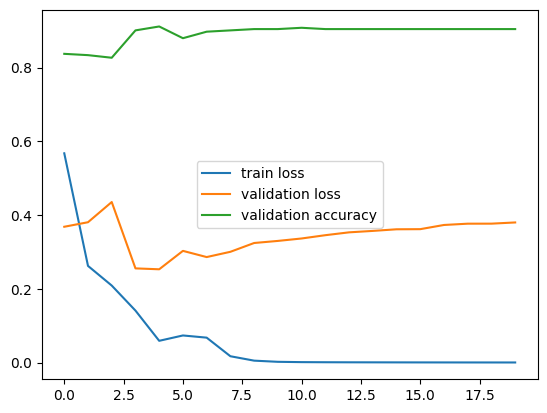

In [ ]:
plt.plot(np.arange(num_epochs), train_loss_prcc_clustered, label='train loss')
plt.plot(np.arange(num_epochs), validate_loss_prcc_clustered, label='validation loss')
plt.plot(np.arange(num_epochs), validate_acc_prcc_clustered, label='validation accuracy')
plt.legend()
plt.show()

#### Utilizing all information

In [ ]:
# For taking out the feature of last layer
class Identity(nn.Module):
    def __init__(self):
        super(Identity, self).__init__()

    def forward(self, x):
        return x


In [ ]:
class CombinedNet_pRCCC(nn.Module):
    def __init__(self, cam16, prcc):
        super().__init__()
        self.prcc = prcc
        self.prcc.fc = Identity()
        for name, param in prcc.named_parameters():
            if 'conv1' in name or 'bn1' in name or 'layer1' in name or 'layer2':
                param.requires_grad = False


        self.cam16 = cam16
        self.cam16.fc = Identity()

        for name, param in cam16.named_parameters():
            if 'conv1' in name or 'bn1' in name or 'layer1' in name or 'layer2':
                param.requires_grad = False

        self.adaptor = torch.nn.Sequential(
            nn.Linear(512 + 512, 5),
        )

    def forward(self, x):
        x1 = self.prcc(x)
        x2 = self.cam16(x)
        out = self.adaptor(torch.cat((x1, x2), dim=1))
        return out

In [ ]:
class CombinedNet_pRCCAE(nn.Module):
    def __init__(self, cam16, prcc):
        super().__init__()
        self.prcc = prcc
        for param in self.prcc.parameters():
          param.requires_grad = False
        # pRCC_autoencoder_trained.encoder[9].requires_grad = True

        self.cam16 = cam16
        self.cam16.fc = Identity()

        for name, param in cam16.named_parameters():
            # further freeze layer 2
            if 'conv1' in name or 'bn1' in name or 'layer1' in name or 'layer2' in name:
                param.requires_grad = False

        self.adaptor = torch.nn.Sequential(
            nn.Linear(512 + 512, 5),
        )

    def forward(self, x):
        x1 = self.prcc.encoder(x)
        x2 = self.cam16(x)
        out = self.adaptor(torch.cat((x1, x2), dim=1))
        return out

In the below function, by passing in False, one can use the binary classifier on pRCC to add additional information.

However, during experiments the approach was not effective and thus by default the autoencoder approach is used.

In [ ]:
def make_combinedNet(use_prcc_ae=True):
  resnet_cam16_trained = make_binary_resnet()
  resnet_cam16_trained.load_state_dict(torch.load('resnet_cam16.pt'))

  if use_prcc_ae:
    # pRCC autoencoder to extract feature
    pRCC_autoencoder_trained = PRCCAutoEncoder()
    pRCC_autoencoder_trained.load_state_dict(torch.load('pRCC_autoencoder.pt'))
    combinedNet = CombinedNet_pRCCAE(resnet_cam16_trained, pRCC_autoencoder_trained).to(device)
  else:
    # binary classifier trained on pRCC clustered image to extract feature
    pRCC_clustered_resnet = make_binary_resnet()
    pRCC_clustered_resnet_trained.load_state_dict(torch.load('pRCC_clustered_resnet.pt'))
    combinedNet = CombinedNet_pRCCC(resnet_cam16_trained, pRCC_clustered_resnet_trained).to(device)
  return combinedNet

##### Train with 100% masked WBC data

In [ ]:
combinedNet = make_combinedNet()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(combinedNet.parameters(), lr=learning_rate, momentum=0.9)


best_acc = float('-inf')
train_loss_combined = []
validate_loss_combined = []
validate_acc_combined = []
for epoch in range(num_epochs):
    train_loss = train(combinedNet, wbc_100_maksed_trainloader, epoch)
    val_acc, val_loss = validate(combinedNet, wbc_100_valloader, epoch)
    if val_acc > best_acc:
      torch.save(combinedNet.state_dict(), 'combinedNet_wbc_100.pt')
      best_acc = val_acc
    # for visualization later
    train_loss_combined.append(train_loss)
    validate_loss_combined.append(val_loss)
    validate_acc_combined.append(val_acc)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


Epoch [1/30], Step [20/132], Train loss: 1.0947
Epoch [1/30], Step [40/132], Train loss: 0.8543
Epoch [1/30], Step [60/132], Train loss: 0.5751
Epoch [1/30], Step [80/132], Train loss: 0.5026
Epoch [1/30], Step [100/132], Train loss: 0.3848
Epoch [1/30], Step [120/132], Train loss: 0.2264
Epoch 1 Loss: 0.7514840817135392
--- Epoch 1 Validation Accurancy: 0.851, Validation Loss: 0.3983 --- 
Epoch [2/30], Step [20/132], Train loss: 0.4689
Epoch [2/30], Step [40/132], Train loss: 0.2369
Epoch [2/30], Step [60/132], Train loss: 0.1234
Epoch [2/30], Step [80/132], Train loss: 0.1609
Epoch [2/30], Step [100/132], Train loss: 0.1335
Epoch [2/30], Step [120/132], Train loss: 0.2132
Epoch 2 Loss: 0.22919092217290943
--- Epoch 2 Validation Accurancy: 0.916, Validation Loss: 0.2342 --- 
Epoch [3/30], Step [20/132], Train loss: 0.1552
Epoch [3/30], Step [40/132], Train loss: 0.1282
Epoch [3/30], Step [60/132], Train loss: 0.1023
Epoch [3/30], Step [80/132], Train loss: 0.2446
Epoch [3/30], Step [1

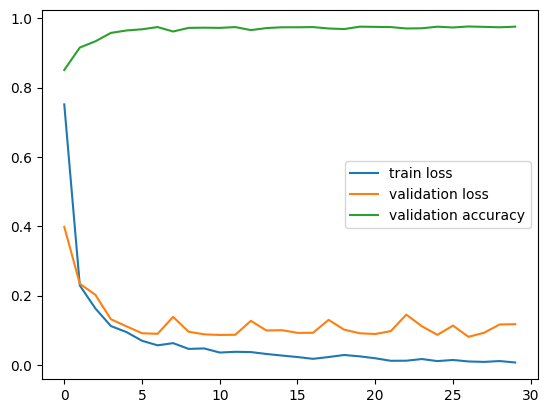

In [ ]:
plt.plot(np.arange(num_epochs), train_loss_combined, label='train loss')
plt.plot(np.arange(num_epochs), validate_loss_combined, label='validation loss')
plt.plot(np.arange(num_epochs), validate_acc_combined, label='validation accuracy')
plt.legend()
plt.show()

##### Train with 50% masked WBC data

In [ ]:
combinedNet = make_combinedNet()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(combinedNet.parameters(), lr=learning_rate, momentum=0.9)


best_acc = float('-inf')
train_loss_combined = []
validate_loss_combined = []
validate_acc_combined = []
for epoch in range(num_epochs):
    train_loss = train(combinedNet, wbc_50_maksed_trainloader, epoch)
    val_acc, val_loss = validate(combinedNet, wbc_100_valloader, epoch)
    if val_acc > best_acc:
      torch.save(combinedNet.state_dict(), 'combinedNet_wbc_50.pt')
      best_acc = val_acc
    # for visualization later
    train_loss_combined.append(train_loss)
    validate_loss_combined.append(val_loss)
    validate_acc_combined.append(val_acc)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


Epoch [1/30], Step [20/66], Train loss: 0.8954
Epoch [1/30], Step [40/66], Train loss: 0.7962
Epoch [1/30], Step [60/66], Train loss: 0.7841
Epoch 1 Loss: 1.0801807926459746
--- Epoch 1 Validation Accurancy: 0.690, Validation Loss: 0.7654 --- 
Epoch [2/30], Step [20/66], Train loss: 0.2058
Epoch [2/30], Step [40/66], Train loss: 0.5924
Epoch [2/30], Step [60/66], Train loss: 0.3873
Epoch 2 Loss: 0.37570748579773033
--- Epoch 2 Validation Accurancy: 0.898, Validation Loss: 0.3020 --- 
Epoch [3/30], Step [20/66], Train loss: 0.2830
Epoch [3/30], Step [40/66], Train loss: 0.2412
Epoch [3/30], Step [60/66], Train loss: 0.2146
Epoch 3 Loss: 0.19129608199000359
--- Epoch 3 Validation Accurancy: 0.911, Validation Loss: 0.2631 --- 
Epoch [4/30], Step [20/66], Train loss: 0.1496
Epoch [4/30], Step [40/66], Train loss: 0.0740
Epoch [4/30], Step [60/66], Train loss: 0.1379
Epoch 4 Loss: 0.15875292464977864
--- Epoch 4 Validation Accurancy: 0.942, Validation Loss: 0.1928 --- 
Epoch [5/30], Step [2

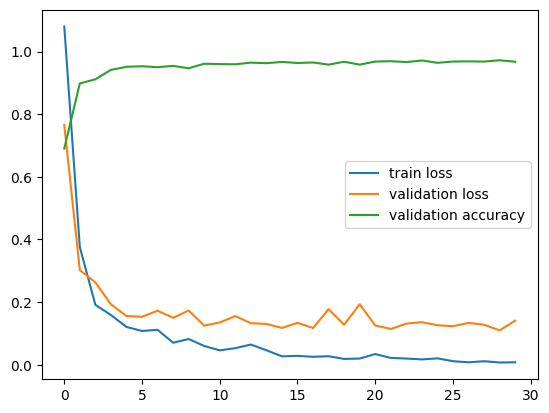

In [ ]:
plt.plot(np.arange(num_epochs), train_loss_combined, label='train loss')
plt.plot(np.arange(num_epochs), validate_loss_combined, label='validation loss')
plt.plot(np.arange(num_epochs), validate_acc_combined, label='validation accuracy')
plt.legend()
plt.show()

##### Train with 10% maksed WBC data

In [ ]:
combinedNet = make_combinedNet()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(combinedNet.parameters(), lr=learning_rate, momentum=0.9)


best_acc = float('-inf')
train_loss_combined = []
validate_loss_combined = []
validate_acc_combined = []
for epoch in range(num_epochs):
    train_loss = train(combinedNet, wbc_10_maksed_trainloader, epoch)
    val_acc, val_loss = validate(combinedNet, wbc_100_valloader, epoch)
    if val_acc > best_acc:
      torch.save(combinedNet.state_dict(), 'combinedNet_wbc_10.pt')
      best_acc = val_acc
    # for visualization later
    train_loss_combined.append(train_loss)
    validate_loss_combined.append(val_loss)
    validate_acc_combined.append(val_acc)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


Epoch 1 Loss: 2.175289579800197
--- Epoch 1 Validation Accurancy: 0.598, Validation Loss: 1.7131 --- 
Epoch 2 Loss: 1.4196331288133348
--- Epoch 2 Validation Accurancy: 0.563, Validation Loss: 1.2288 --- 
Epoch 3 Loss: 1.0249377874590988
--- Epoch 3 Validation Accurancy: 0.727, Validation Loss: 1.2057 --- 
Epoch 4 Loss: 0.679745940225465
--- Epoch 4 Validation Accurancy: 0.769, Validation Loss: 0.8354 --- 
Epoch 5 Loss: 0.42459000434194294
--- Epoch 5 Validation Accurancy: 0.876, Validation Loss: 0.3922 --- 
Epoch 6 Loss: 0.3515133730002812
--- Epoch 6 Validation Accurancy: 0.889, Validation Loss: 0.3269 --- 
Epoch 7 Loss: 0.35227649978228975
--- Epoch 7 Validation Accurancy: 0.901, Validation Loss: 0.3309 --- 
Epoch 8 Loss: 0.2279782353767327
--- Epoch 8 Validation Accurancy: 0.902, Validation Loss: 0.2939 --- 
Epoch 9 Loss: 0.13954376269664084
--- Epoch 9 Validation Accurancy: 0.914, Validation Loss: 0.2775 --- 
Epoch 10 Loss: 0.10486478305288724
--- Epoch 10 Validation Accurancy: 0.

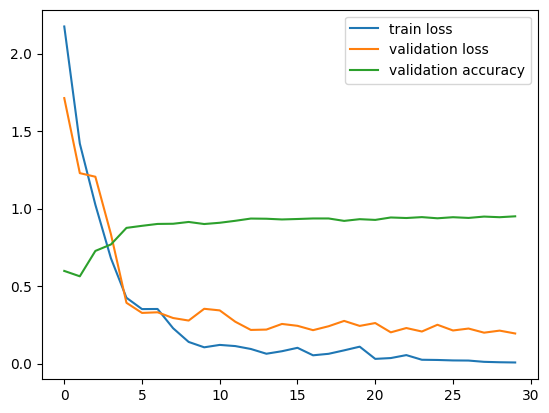

In [ ]:
plt.plot(np.arange(num_epochs), train_loss_combined, label='train loss')
plt.plot(np.arange(num_epochs), validate_loss_combined, label='validation loss')
plt.plot(np.arange(num_epochs), validate_acc_combined, label='validation accuracy')
plt.legend()
plt.show()

##### Train with 1% masked WBC data

In [ ]:
combinedNet = make_combinedNet()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(combinedNet.parameters(), lr=learning_rate, momentum=0.9)


best_acc = float('-inf')
train_loss_combined = []
validate_loss_combined = []
validate_acc_combined = []
for epoch in range(num_epochs):
    train_loss = train(combinedNet, wbc_1_maksed_trainloader, epoch)
    val_acc, val_loss = validate(combinedNet, wbc_100_valloader, epoch)
    if val_acc > best_acc:
      torch.save(combinedNet.state_dict(), 'combinedNet_wbc_1.pt')
      best_acc = val_acc
    # for visualization later
    train_loss_combined.append(train_loss)
    validate_loss_combined.append(val_loss)
    validate_acc_combined.append(val_acc)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


Epoch 1 Loss: 1.8140740990638733
--- Epoch 1 Validation Accurancy: 0.613, Validation Loss: 2.1081 --- 
Epoch 2 Loss: 2.978499114513397
--- Epoch 2 Validation Accurancy: 0.394, Validation Loss: 1.7658 --- 
Epoch 3 Loss: 2.2218106985092163
--- Epoch 3 Validation Accurancy: 0.432, Validation Loss: 2.2149 --- 
Epoch 4 Loss: 2.555716037750244
--- Epoch 4 Validation Accurancy: 0.628, Validation Loss: 1.3207 --- 
Epoch 5 Loss: 1.4218515157699585
--- Epoch 5 Validation Accurancy: 0.630, Validation Loss: 1.9284 --- 
Epoch 6 Loss: 1.7233983278274536
--- Epoch 6 Validation Accurancy: 0.557, Validation Loss: 1.9789 --- 
Epoch 7 Loss: 2.262422561645508
--- Epoch 7 Validation Accurancy: 0.642, Validation Loss: 1.9606 --- 
Epoch 8 Loss: 1.7260587215423584
--- Epoch 8 Validation Accurancy: 0.632, Validation Loss: 1.8029 --- 
Epoch 9 Loss: 1.5786795616149902
--- Epoch 9 Validation Accurancy: 0.615, Validation Loss: 1.9645 --- 
Epoch 10 Loss: 1.3487884402275085
--- Epoch 10 Validation Accurancy: 0.546, 

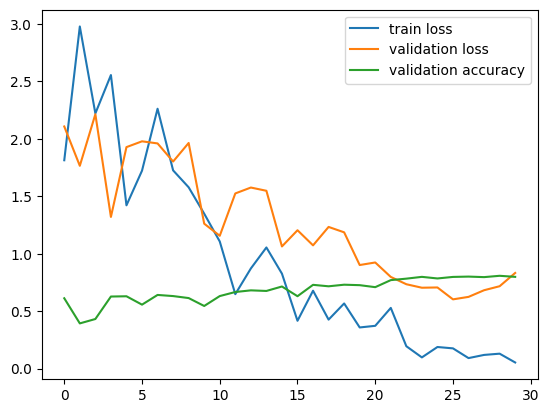

In [ ]:
plt.plot(np.arange(num_epochs), train_loss_combined, label='train loss')
plt.plot(np.arange(num_epochs), validate_loss_combined, label='validation loss')
plt.plot(np.arange(num_epochs), validate_acc_combined, label='validation accuracy')
plt.legend()
plt.show()